In [1]:
from pathlib import Path
import os
import sys
import pandas as pd
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout,BatchNormalization
from tensorflow.keras import regularizers
from tensorflow.keras.applications import VGG16
from sklearn.model_selection import train_test_split
# Local modules
from cub_tools.train import train_model
from cub_tools.visualize import imshow, visualize_model
from cub_tools.utils import unpickle, save_pickle
from cub_tools.transforms import makeDefaultTransforms
from sklearn.preprocessing import LabelEncoder


In [2]:
import cv2
dt=os.listdir("data")
path="data/"
im_size=128
X=[]
label=[]

for i in dt:
    data_p=path+str(i)
    file=[i for i in os.listdir(data_p)]
    for f in file:
        img = cv2.imread(data_p+'/'+f)
        ima=cv2.resize(img,(im_size,im_size))
        X.append(ima)
        label.append(i)

In [3]:
images=[]
for item in dt:
    books=os.listdir('data'+'/'+item)
    for book in books:
        images.append((item,str('data'+'/'+item)))
images_df= pd.DataFrame(data=images,columns=["label","images"])
print(images_df.head())
images_df.tail()        
# lab code with small editing 
def plot_digits(instances, images_per_row=5, **options):
    size = 128
    plt.figure(figsize=(300, 70))
    images_per_row = min(len(instances), images_per_row)
    images = [instance.reshape(size,size,3) for instance in instances]
    n_rows = (len(instances) - 1) // images_per_row + 1
    row_images = []
    n_empty = n_rows * images_per_row - len(instances)
    images.append(np.zeros((size, size * n_empty,3)))
    for row in range(n_rows):
        rimages = images[row * images_per_row : (row + 1) * images_per_row]
        row_images.append(np.concatenate(rimages, axis=1))
    image = np.concatenate(row_images, axis=0)
    
    plt.imshow(image, cmap = matplotlib.cm.binary, **options)
    
    plt.axis("off")
    plt.show()

  label  images
0     0  data/0
1     0  data/0
2     0  data/0
3     0  data/0
4     0  data/0


In [4]:
y=images_df["label"].values


y_labelencoder= LabelEncoder()
y=y_labelencoder.fit_transform(y)


In [5]:
import matplotlib
lis=[]
for i in range(2):
    a=np.where (y==i)[0]
   
    lis.append(np.array(a[0:10]))

images=[]
for i in range(2):
    for n in range(5):
        x=lis[i][n]
        images.append(X[x])
plot_digits(images)   

In [6]:
y_labelencoder= LabelEncoder()
y_train=y_labelencoder.fit_transform(label)




In [7]:
from tensorflow.keras import layers
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.5),
])


In [8]:
def data_augment(data,label):
    new_data=[]
    new_label=[]
    for i in range(len(data)):
        for i in range(20):
            
            new_data.append(data_augmentation(data[i]))
            new_label.append(label[i])
    return new_data,new_label


In [83]:
new_X,new_y=data_augment(X,y_train)

In [31]:
np.array(X).shape

(136, 128, 128, 3)

In [84]:
np.array(new_X).shape

(2720, 128, 128, 3)

In [7]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.applications import VGG16

In [8]:
vgg_model = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(128, 128, 3))
model = Sequential()

In [22]:
vgg_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0     

In [9]:
for layer in vgg_model.layers[:7]:
    layer.trainable=False
    model.add(layer)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0         
                                                                 
Total params: 260,160
Trainable params: 0
Non-trainable 

In [10]:
model.add(Conv2D(32, (3,3), padding='same', activation='LeakyReLU'))
model.add(MaxPooling2D())
model.add(Conv2D(64, (3,3),  padding='same',activation='LeakyReLU'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(256, activation='LeakyReLU',name='fc'))
model.add(Dense(2, activation='softmax'))
model.compile(loss='categorical_crossentropy',
              optimizer="Adam",
              metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 32)        3

In [11]:
from sklearn.utils import shuffle
X_train,y_train =shuffle(X,y_train)


In [12]:
nClasses = 2
# Use Keras' handy utils
y_train_k = tensorflow.keras.utils.to_categorical(y_train, num_classes=nClasses)
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10)

In [13]:
batchSize = 64
nEpochs = 1000

history = model.fit(np.array(X_train), y_train_k, batch_size=batchSize, epochs=nEpochs, verbose=1, 
                    validation_split=.1,shuffle=True,callbacks=[callback])

Epoch 1/1000
2/2 [==============================] - 4s 1s/step - loss: 6923.5278 - accuracy: 0.5492 - val_loss: 8731.5762 - val_accuracy: 0.5714
Epoch 2/1000
2/2 [==============================] - 0s 67ms/step - loss: 4598.1333 - accuracy: 0.5984 - val_loss: 6454.6172 - val_accuracy: 0.4286
Epoch 3/1000
2/2 [==============================] - 0s 62ms/step - loss: 5197.7974 - accuracy: 0.4016 - val_loss: 1605.6462 - val_accuracy: 0.5714
Epoch 4/1000
2/2 [==============================] - 0s 64ms/step - loss: 2076.6663 - accuracy: 0.5984 - val_loss: 2117.7539 - val_accuracy: 0.5714
Epoch 5/1000
2/2 [==============================] - 0s 63ms/step - loss: 1406.6057 - accuracy: 0.5984 - val_loss: 27.0335 - val_accuracy: 0.8571
Epoch 6/1000
2/2 [==============================] - 0s 62ms/step - loss: 330.9036 - accuracy: 0.6311 - val_loss: 621.0761 - val_accuracy: 0.4286
Epoch 7/1000
2/2 [==============================] - 0s 51ms/step - loss: 347.1329 - accuracy: 0.6311 - val_loss: 294.9146 - 

In [126]:
# this function from the lab fmnistCNN
def plot_accuracy(history):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    # this function from the lab fmnistCNN
def plot_loss(history):
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['train', 'test'], loc='upper left')
    ax.set_yscale('log')
    plt.show()

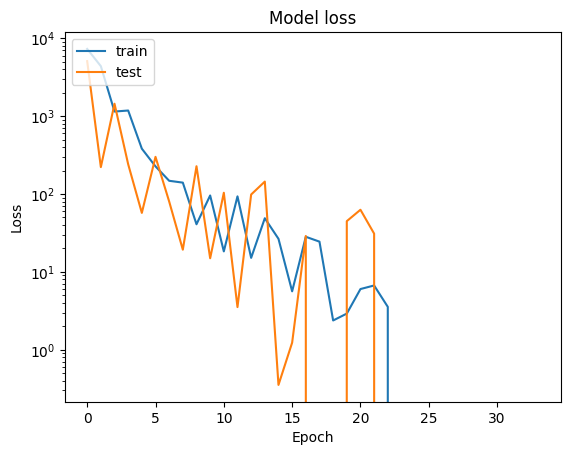

In [127]:
plot_loss(history)

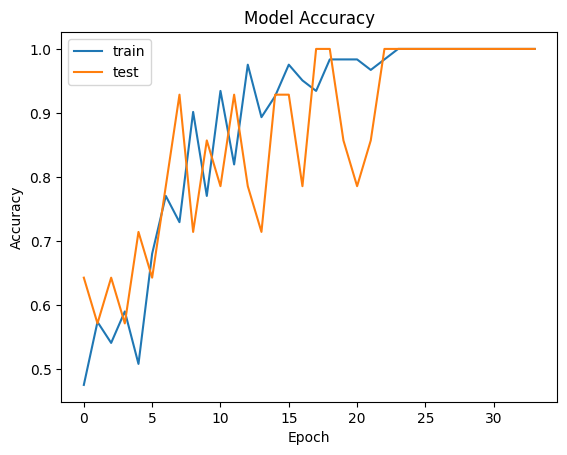

In [128]:
plot_accuracy(history)

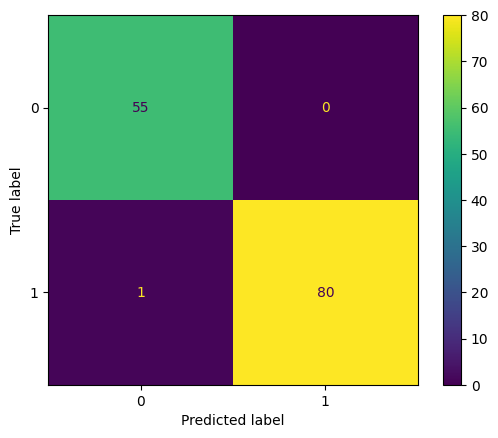

In [16]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
y_pred=[]
for point in np.array(X_train):
    
    y_pred.append(np.argmax(model.predict(point.reshape([1,128,128,3]))))

cm = confusion_matrix(y_train,y_pred, labels=np.unique(y_train))
disp = ConfusionMatrixDisplay(confusion_matrix=cm )
disp.plot()

1

In [14]:
from keract import get_activations
activations = get_activations(model, X_train[2].reshape([1,128,128,3]))

input_1 (1, 128, 128, 3) 


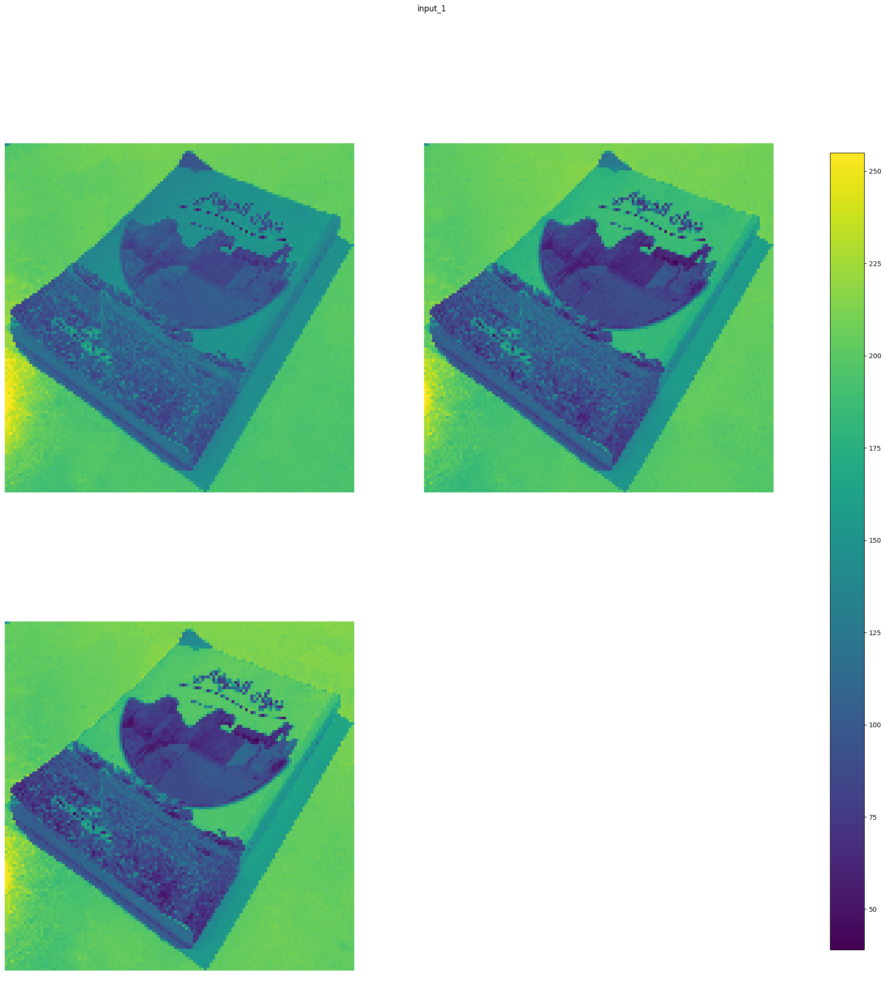

block1_conv1 (1, 128, 128, 64) 


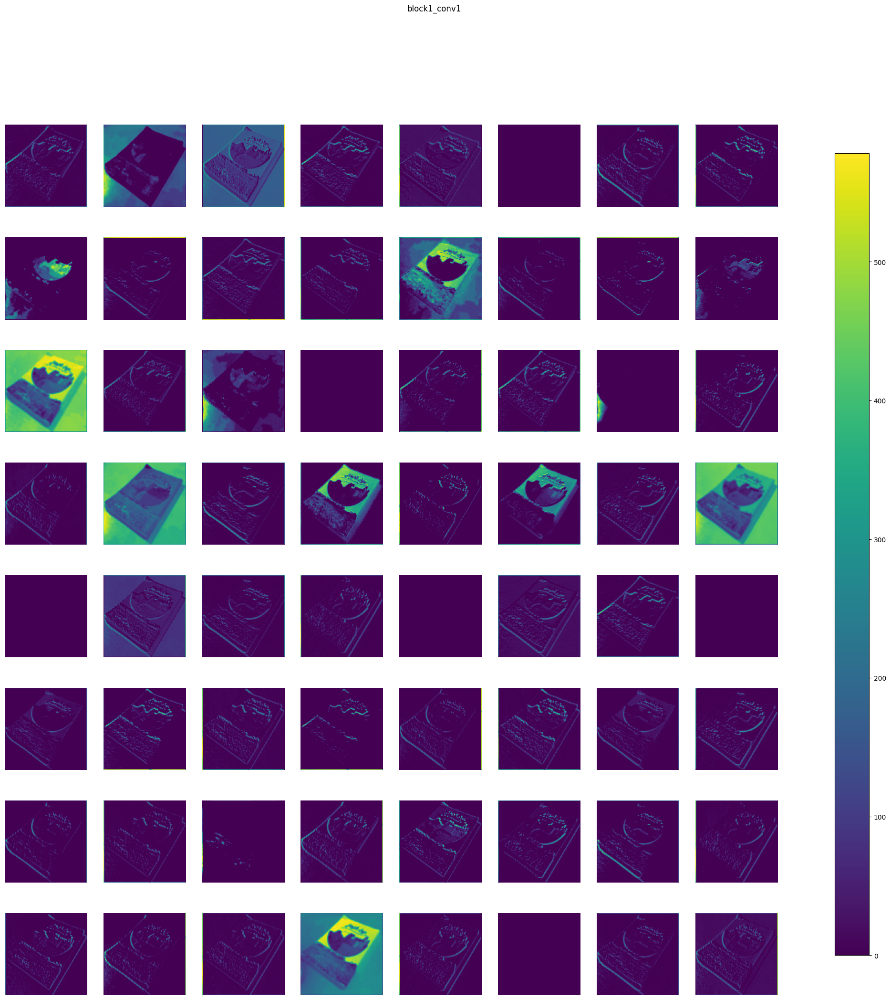

block1_conv2 (1, 128, 128, 64) 


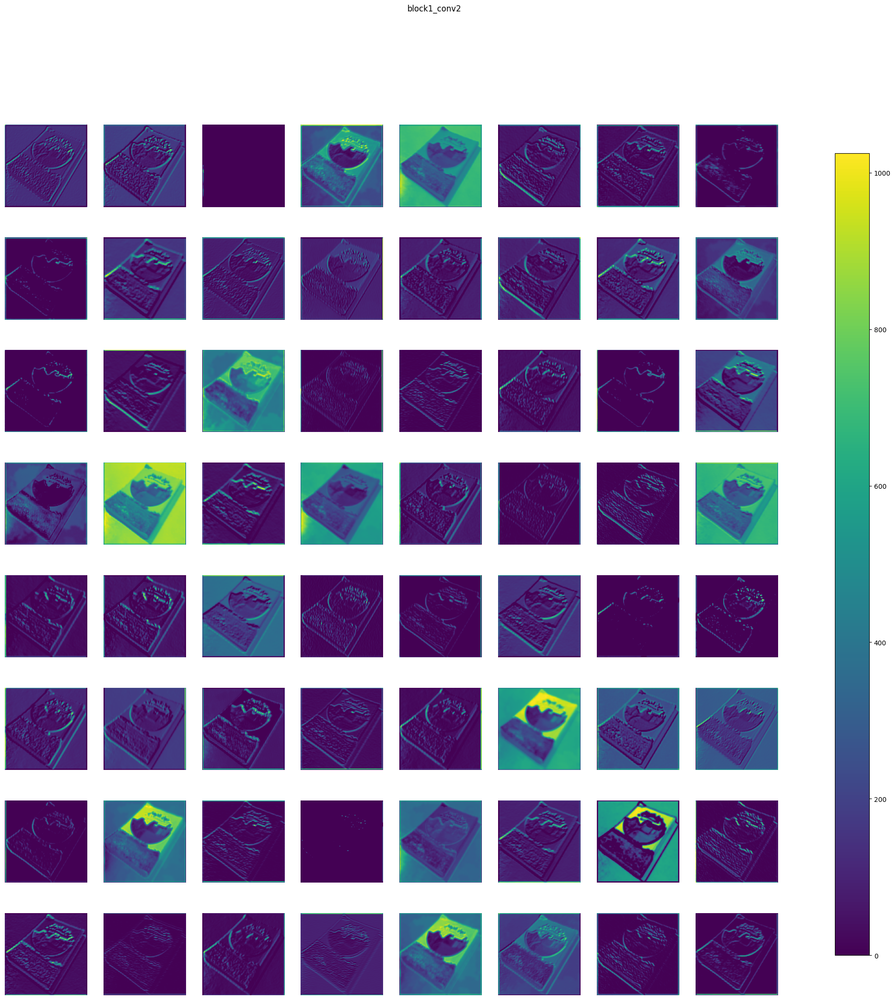

block1_pool (1, 64, 64, 64) 


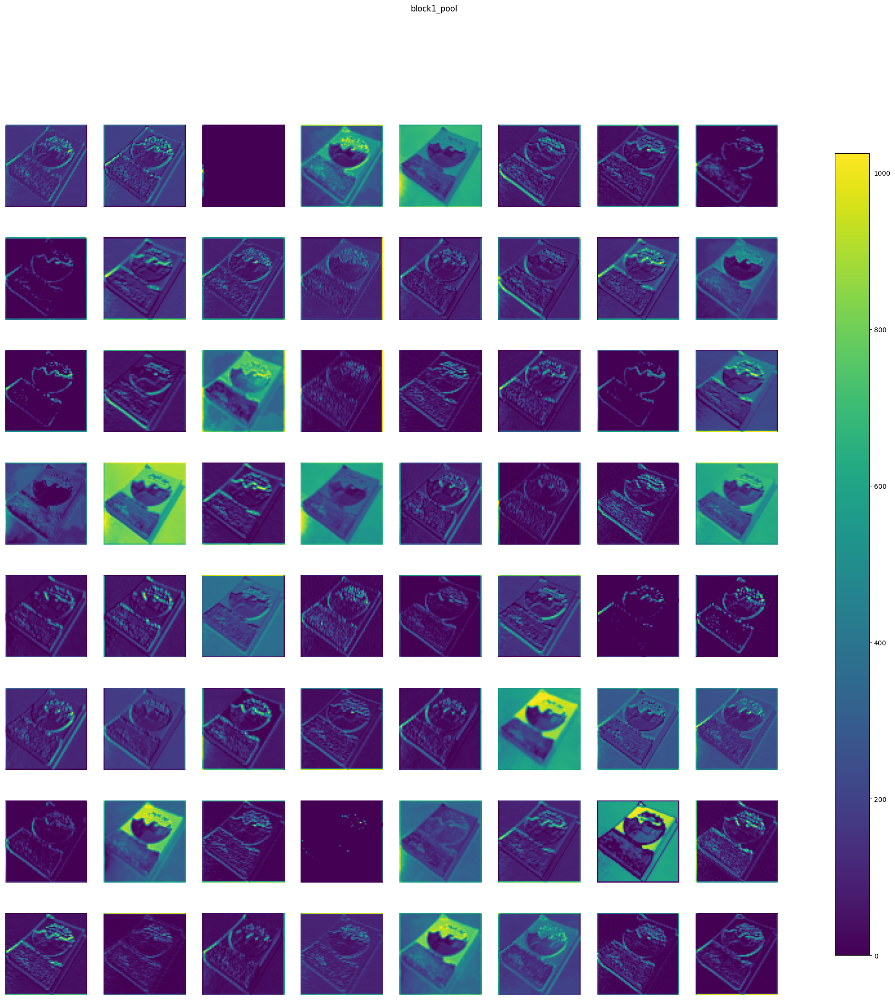

block2_conv1 (1, 64, 64, 128) 


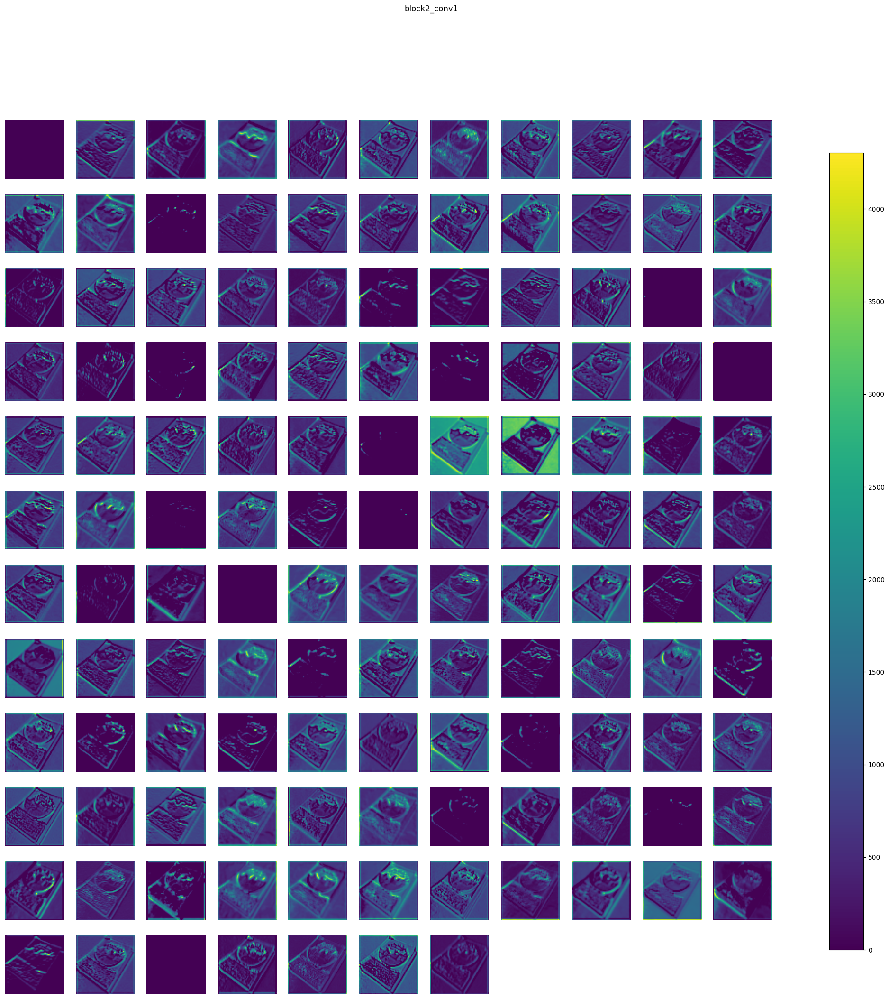

block2_conv2 (1, 64, 64, 128) 


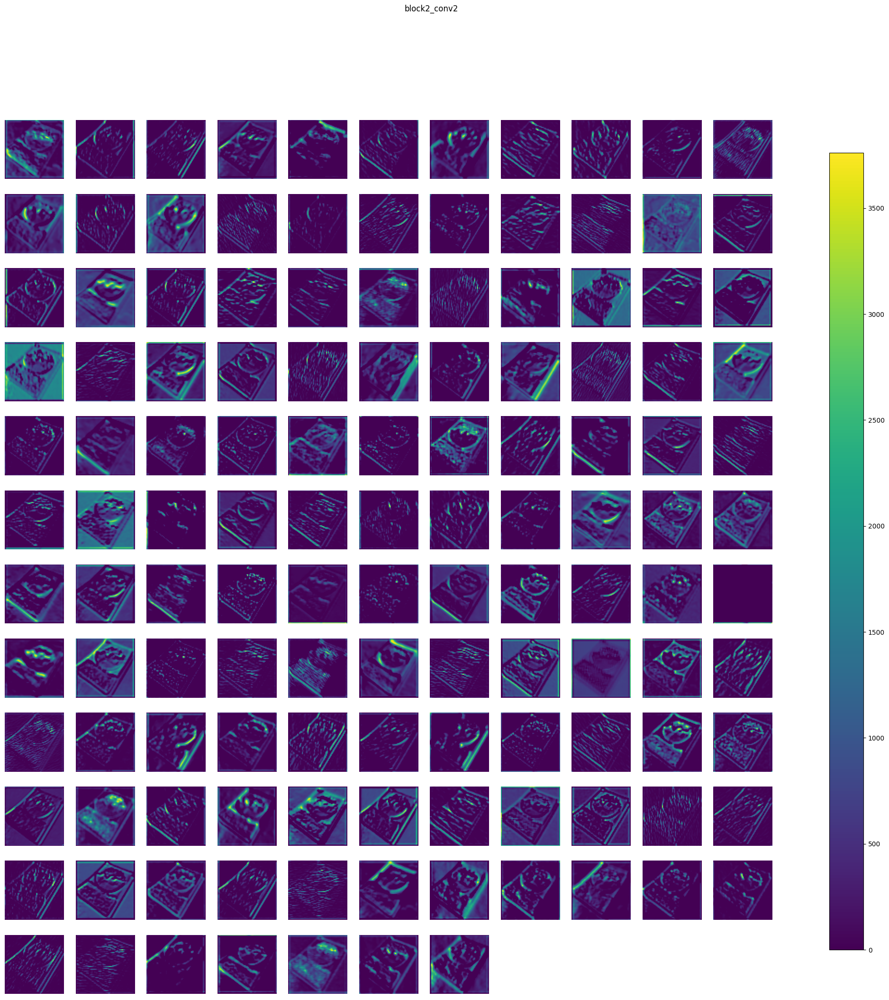

block2_pool (1, 32, 32, 128) 


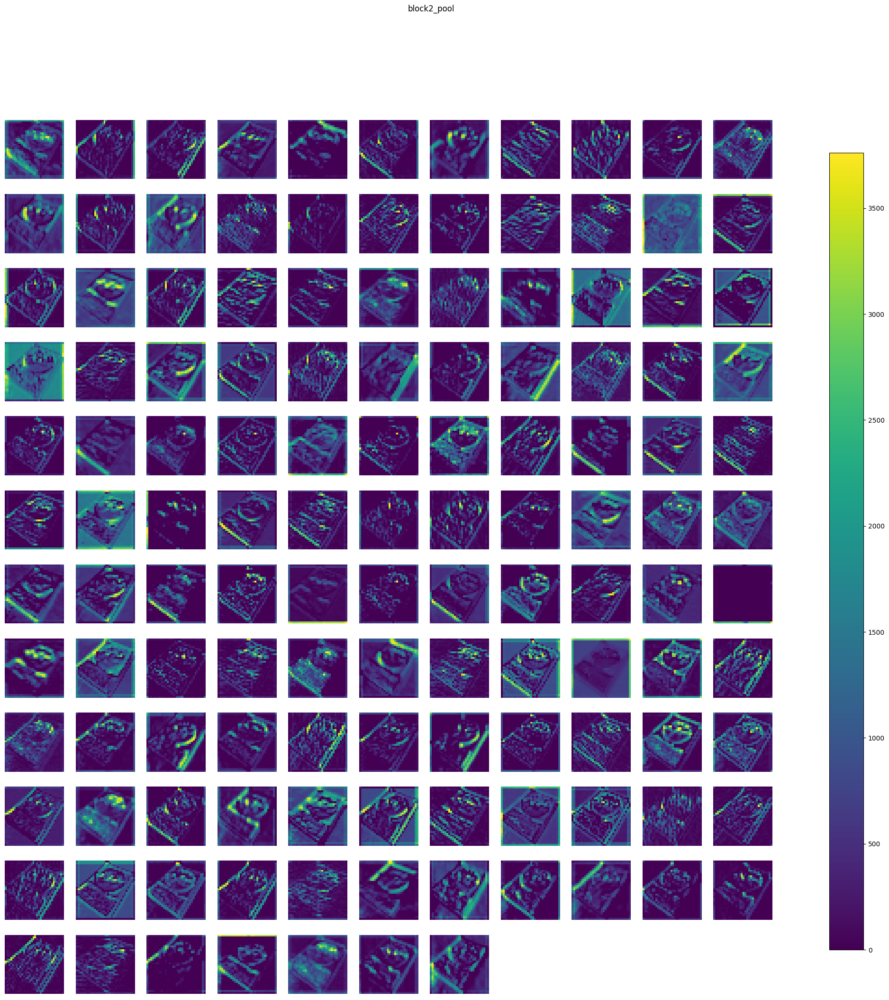

conv2d (1, 32, 32, 32) 


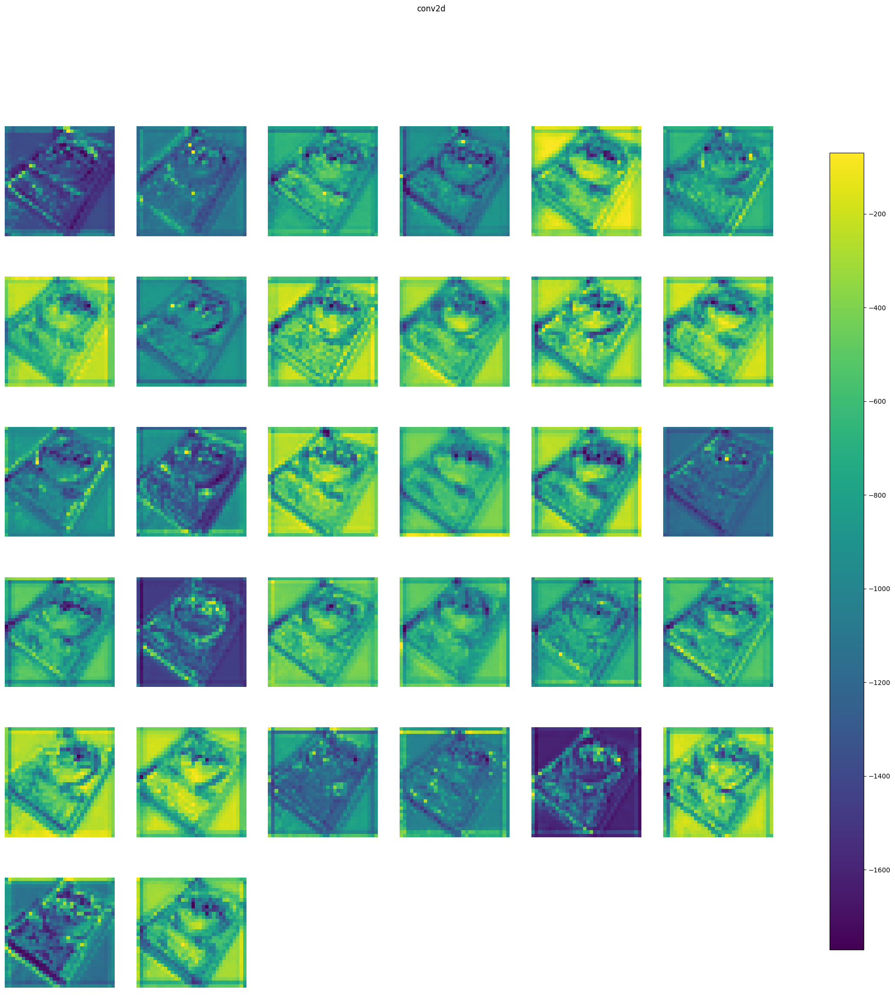

max_pooling2d (1, 16, 16, 32) 


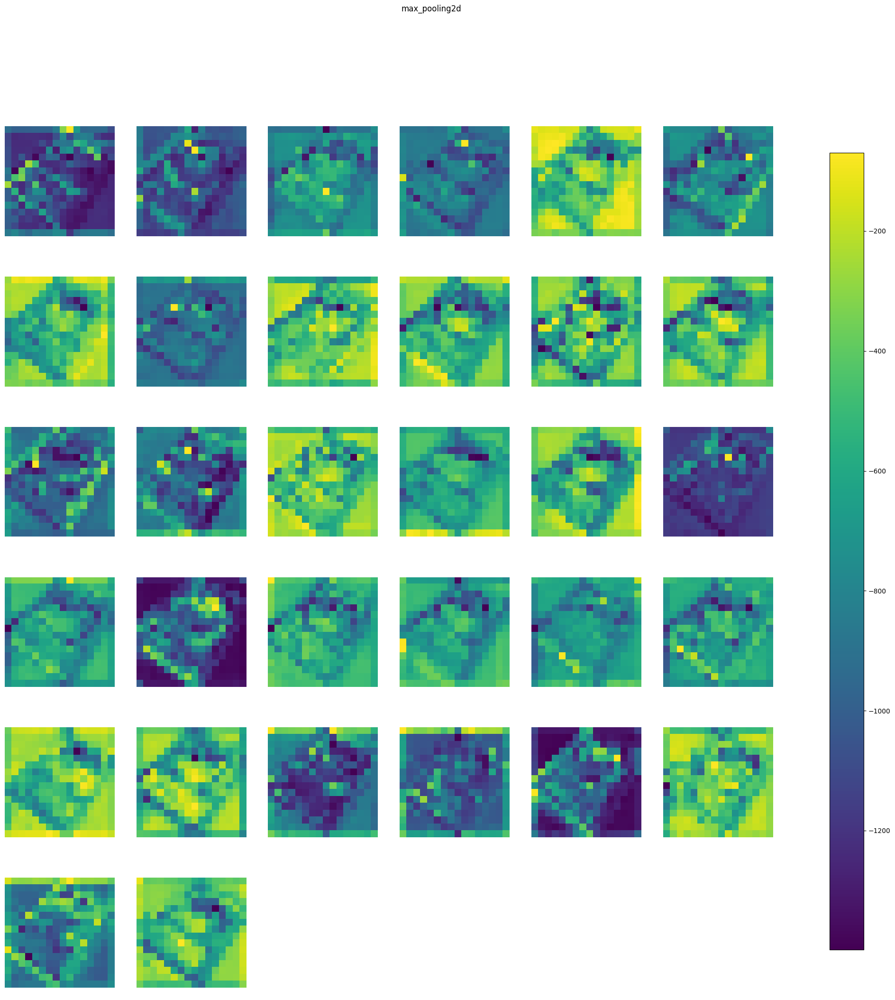

conv2d_1 (1, 16, 16, 64) 


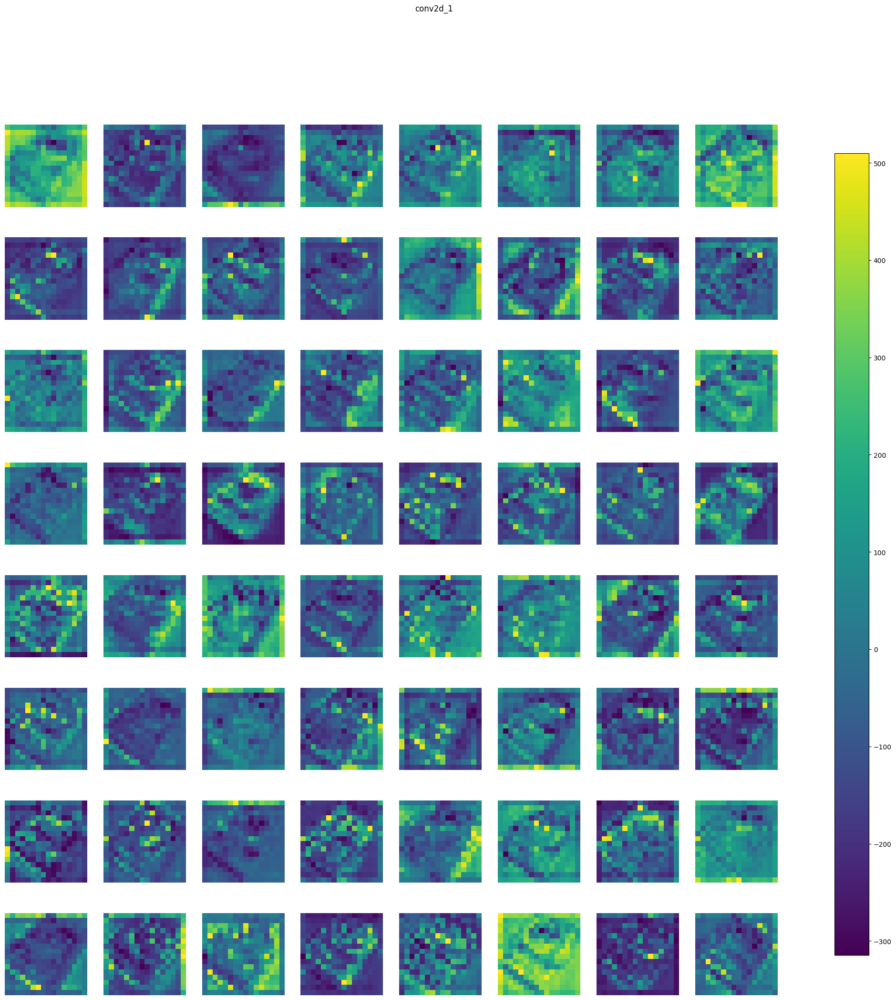

max_pooling2d_1 (1, 8, 8, 64) 


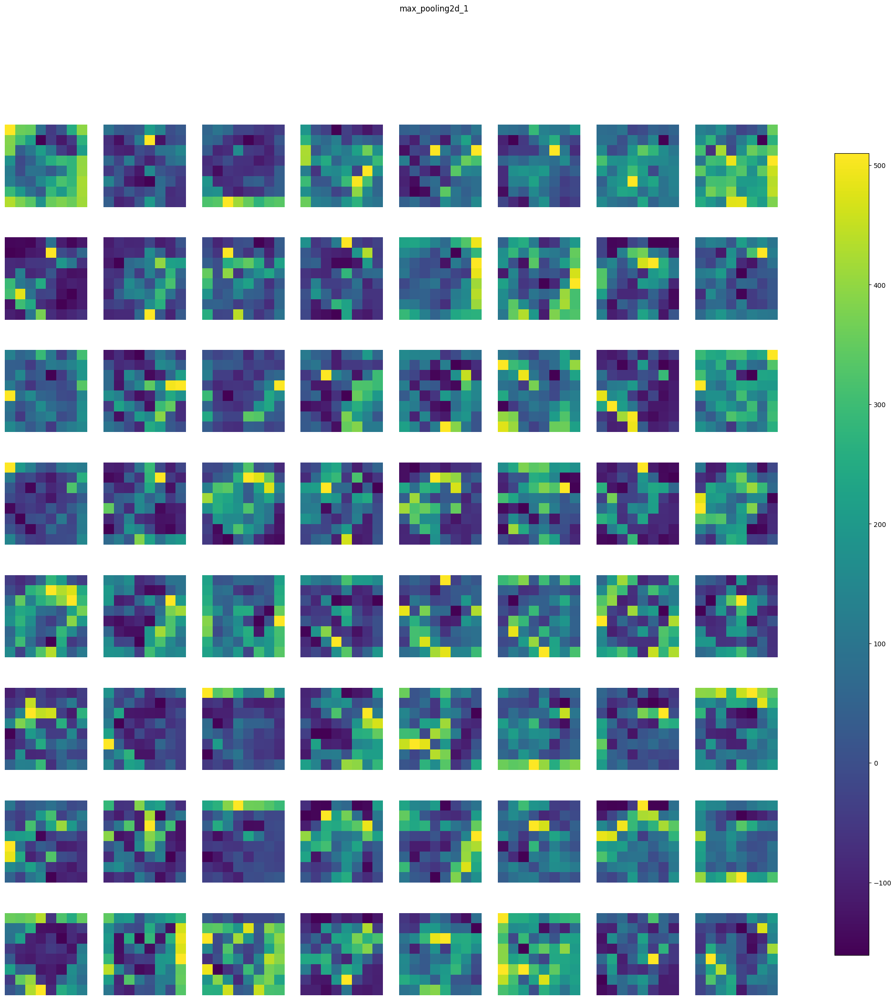

flatten (1, 4096) 


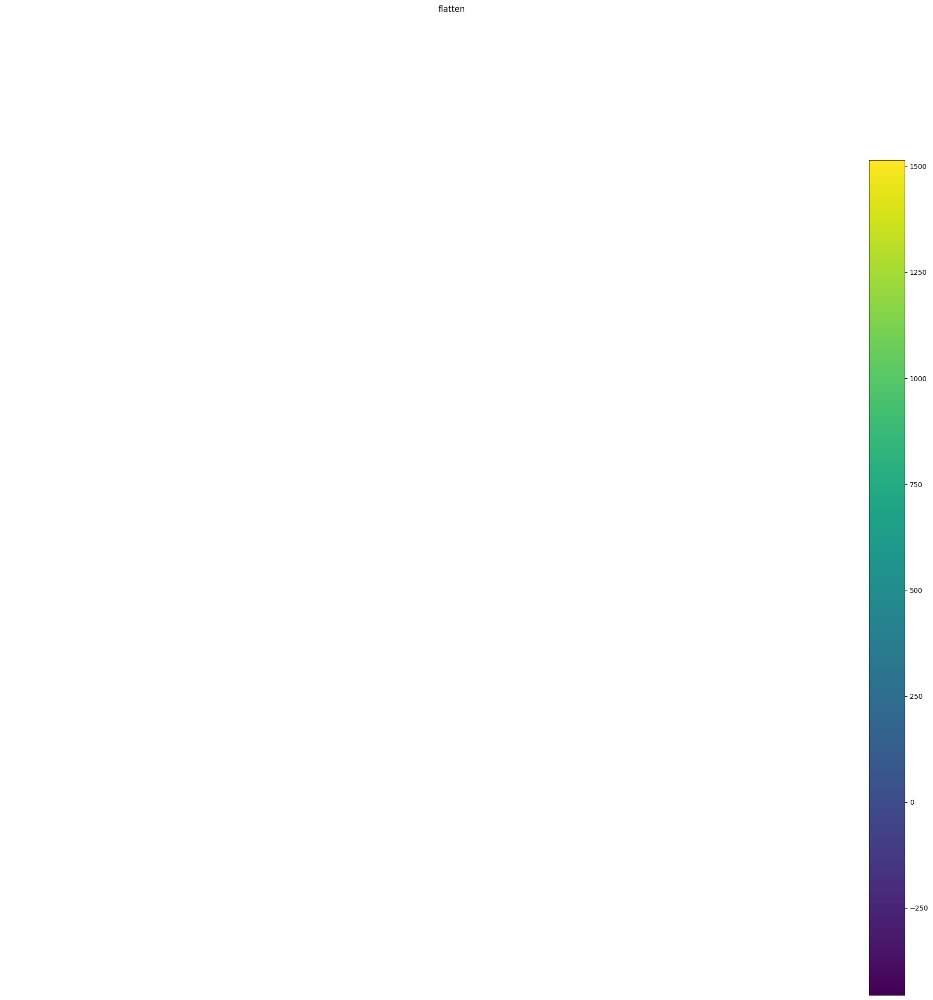

fc (1, 256) 


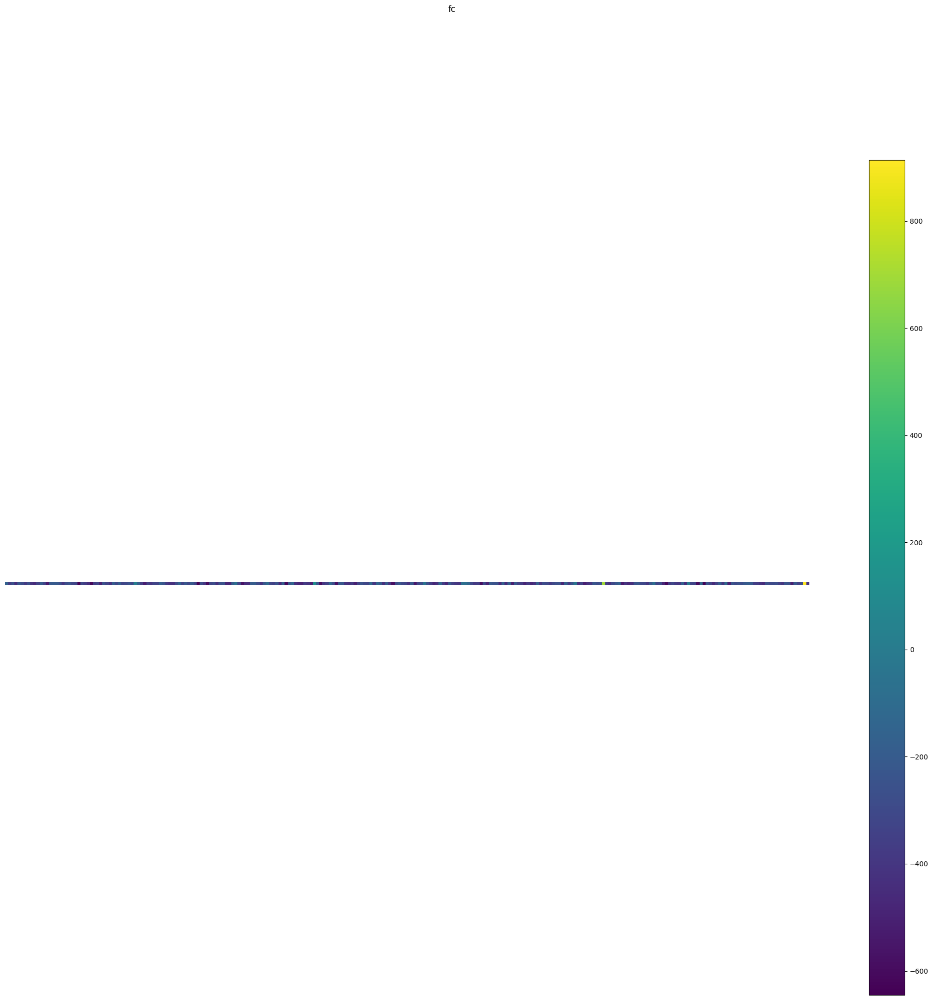

dense (1, 2) 


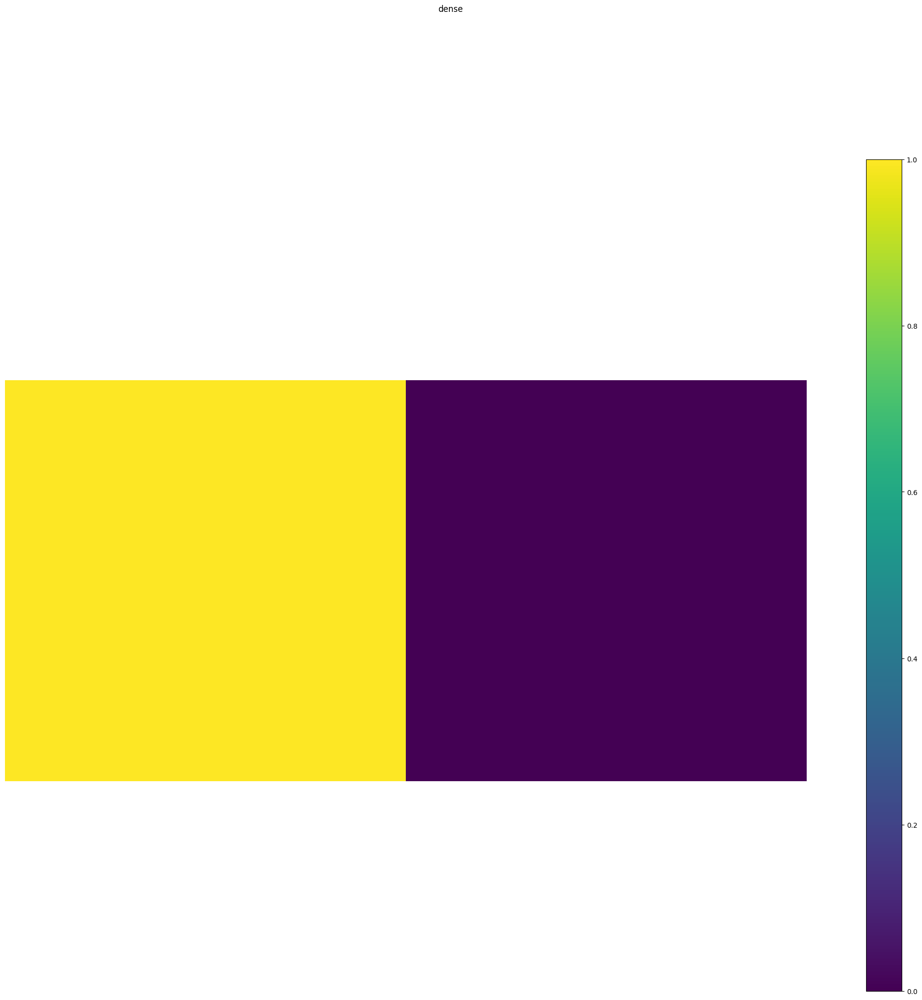

In [15]:
from keract import display_activations
display_activations(activations, save=False)

In [16]:
feat_extractor = Model(inputs=model.input,
                       outputs=model.get_layer('fc').output)
features = feat_extractor.predict(np.array(X_train), batch_size=4)

In [17]:
import numpy as np
from sklearn.manifold import TSNE
tsne = TSNE().fit_transform(features)
tx, ty = tsne[:,0], tsne[:,1]
tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

C:\Users\Mohamed\AppData\Local\Temp/ipykernel_16680/284642793.py:13: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  Image.ANTIALIAS)


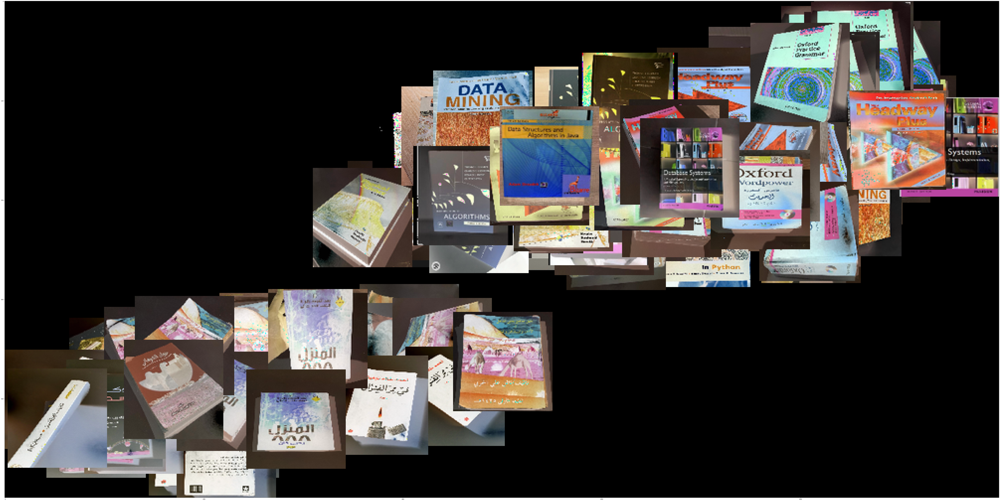

In [18]:
import matplotlib.pyplot as plt
from PIL import Image
width = 1000
height = 500
max_dim = 100
full_image = Image.new('RGB', (width, height))
plt.figure(figsize=(128, 128))
for idx, x in enumerate(X_train):
    tile = Image.fromarray(np.uint8(x * 255))
    rs = max(1, tile.width / max_dim, tile.height / max_dim)
    tile = tile.resize((int(tile.width / rs),
                        int(tile.height / rs)),
                       Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim) * tx[idx]),
                            int((height-max_dim) * ty[idx])))
plt.imshow(full_image) 

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


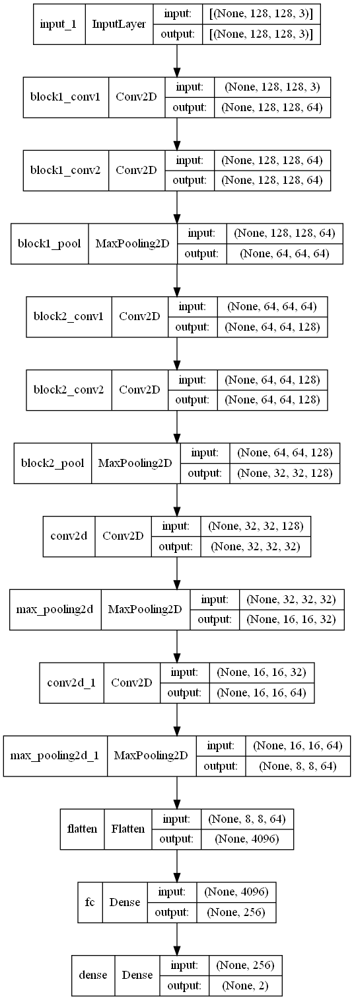

In [21]:

from keras.models import Sequential
from keras.layers import Dense
from keras.utils.vis_utils import plot_model

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [23]:

from keras.models import load_model
model.save("model.h5")
loaded_model = load_model("model.h5")

# https://medium.com/ymedialabs-innovation/data-augmentation-techniques-in-cnn-using-tensorflow-371ae43d5be9

# https://medium.com/@mygreatlearning/everything-you-need-to-know-about-vgg16-7315defb5918

# https://www.analyticsvidhya.com/blog/2021/05/convolutional-neural-networks-cnn/

# activation function : https://www.kdnuggets.com/2022/02/vanishing-gradient-problem.html

In [ ]:
[2 3 4
5 6 7 
3 6 8]
[2 3 4 5 4 7 3 68 ]